# Exploring Recommendation System Suitability By User History Depth  
## Feature Engineering 
Pippi de Bree

## Table of Contents
### [Introduction](#Introduction)
### [Library Imports](#Imports)
### [Taste Profile Feature Engineering](#Taste) 
### [Lakh Dataset Feature Engineering](#Lakh)
#### - [Principal Component Analysis](#pca)
#### - [Clustering](#Clustering)
### [Conclusion](#Conclusion)

# Introduction <a id=Introduction a>

After our exploration of the variables within the taste profile and song datasets, we can begin considering preprocessing beyond encoding (which was performed in the `2_EDA.ipynb` notebook to reduce the data needed to be moved). In this notebook we will consider whether reducing the dimensions of the dataset will be possible, without reducing its usability. For the taste profile data we will begin to consider necessary scalings to allow us to compare models and work with specific libraries.

# Library and Data Imports <a id=Imports a> 

As usual, we will need to import some packages and libraries to allow our feature engineering processing. 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score

from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from sklearn.model_selection import train_test_split
from sklearn.mixture import GaussianMixture


%config InlineBackend.figure_format='svg'
plt.style.use('seaborn')
%matplotlib inline

from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.preprocessing import OneHotEncoder

from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
from sklearn.metrics import silhouette_score

import ds_utils_capstone
import capstone_utils

import scipy.stats as stats

# setting our style for seaborn visualisations
# plt.style.use('capstyle.mplstyle')


Below we read in the subsets of the data exported at the end of our EDA.

In [2]:
sl_en = ds_utils_capstone.read_csv_pd('data/sub_lmd_encoded.csv', index=True)

DataFrame contains 4216 rows and 191 columns.
No missing values or duplicared rows found.


In [3]:
tp = ds_utils_capstone.read_csv_pd('data/sub_taste.csv', index=False)

DataFrame contains 722394 rows and 3 columns.
No missing values or duplicared rows found.


# Taste Profile Feature Engineering <a id=Taste a>

An issue that we face with our taste data is the format of listen counts. In our modelling phase we will perform a singular value decomposition using the popular Funk SVD algorithm. In order to implement this, within the `Surprise` package, we will need to encode our listen counts to ratings. 

We could consider the difference in how particular users behave. There is a distinction to be made between users who listen to the songs they enjoy many many times more than others. 

Users may listened to their favorite songs to different degrees. For example, the highest count in the taste profile comes from a user listening to a particular song 3532. However, we cannot scale or bin out data using this as the maximum for all users because this will imply that a user who's top listen count is 50, does not like that song as much as the top listeners. Overall, it makes sense to consider users' listen count scales individually. We also have the issue of a high skew towards single listen songs.

In order to scale this data we will mark all songs listened to only once as a '1' ratings. We could consider removing all of these but there is an inherent value in the a listener not returning to a song. This could add some shade to our user profiles. Marking them all as one means that we know that users have only listened once (with binning we could not definitely be sure of this), so we could consider reducing this number. For non-one listen counts we will use a normalisation to bin the listen counts into how they fall into distribution. From our EDA we know that there is a serious left skew in our data (with lower-listen counts being vastly over represented). To find the best method of scaling, we need to consider how we could transform this to have a lower skew. 

We have two main options for dealing with the left skew, a log transformation or a Box Cox transformation to, hopefully, make our data more normal. Our EDA showed that we have a serious right skew, and therefore isolating the single listen counts and assigning them to a 1 rating directly may aide us is creating ratings for multiple listens. 

We will consider two options for our Scaling, a Min-Max Scaler or a Standard Scaler. To begin, we will consider how the data will perform with combinations of the transformation and scaling. The function `dist_considerations` from the `capstone_utils` library will allow us to see how the count data differs with the transformations. It will create plots of the four combinations created by considering log, boxcox and min-max and standard scaling.

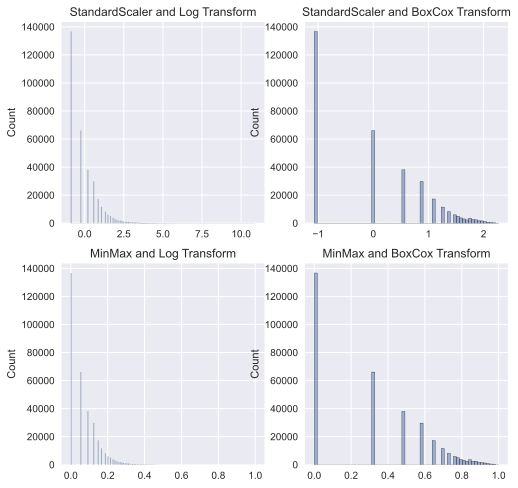

In [4]:
# creating and plotting the mentioned distributions of the count data
plt.figure(figsize=(8,8))
plt = capstone_utils.dist_considerations(tp[tp['count']>1]['count'])
plt.savefig('images/scaldists.png')
plt.show()

We can see no successful normal distribution approximation. But, as can be seen, using boxcox over the log transform gives a flatter distribution (even though there are larger gaps between the data). In order to create bins that can be cut to ratings, a scaling needs to be used so that it could be applied to users' listening history specifically (rather than all together). Though scaling all together is far more computationally doable, scaling each individual user may is likely to reduce biases created by specific users. However, this user-based scaling will only make sense if each individual user has enough data for their listening histroy (these transformations would likely be unhelpful for only two data points). As we hope to consider both, we will explore a function that considers two types of scaling (overall and by-user) to apply to our minmax-boxcox transformed data. This function can both be found in the `capstone_utils` package and is named `scaling_mmb`. It takes in a parameter `scale_type` which can be used to set the scaling to overall (`together`) and by user (`userbased`). The first transforms and scales the data all together, then bins it based on the section of the scaled data by the following metric (in theory evenly) across the min-max scaling (values are transformed to 0-1).

- `2` - 0% - 25% 
- `3` - 25% - 50%
- `4` - 50% - 75%
- `5` - 75% - 100% 

The user based scaling follows the same metric, but the boxcox transform does not work when all counts are even. To account for this, in cases where the data is all even they are all assigned to `3` ratings because they would end up in the middle of the scaling. 

As we have a few differnt recommendation systems to consider, we will not transfrom this data at this point. Instead we will build these scalings into the systems so that we can consider the impact that using them makes. 

Below is an example of the scaling function `scaling_mmb` and the value counts for each rating. Note that these are not equally distributed between the ratings. This means that the modelling will be skewed towards more popular ratings but we may need to consider that users do not have equal ratings for the songs they enjoy. Generally, people do not love as many songs as they like and having this reflected in the data means that there will not be a skew towards over-stating the likelihood that a user will enjoy a song (more details and explaination of this line of thinking can be found in the `4_RecommendationEvaluation.ipynb` notebook.

In [5]:
tp_scal_together = capstone_utils.scaling_mmb(tp)

1.0    380936
2.0    136709
3.0    104088
4.0     66462
5.0     34199
Name: rating, dtype: int64


To show how the user-based rating performs we will take a subsection of the data with many user counts. This will ensure that users have enough data to scale and bin. It should be noted that this user-based scaling is only practical when there is enough data per-user. 

In [6]:
# get appearance counts for user and select those that appear above the necessary threshold
uc = tp['user'].value_counts()
enough_listens = uc[uc >= 75].index.values

# scale users who appear enough
tp_scale_user = capstone_utils.scaling_mmb(tp[tp['user'].isin(enough_listens)], scale_type='userbased')

1.0    27000
2.0    10573
4.0     5188
3.0     4725
5.0     3988
Name: rating, dtype: int64


Having explored options for rating our listen-count based data, we can now begin to look at potential alterations to our song data.

# Lakh (Song Data) Feature Engineering <a id=Lakh a>

## Principal Component Analysis <a id=pca a>

Given that our use of the similar artists and artist terms variables has given us a large number of features, we need to consider how to reduce these (to avoid overfitting) without losing the variance in our data that sets apart the songs. 

In order to ensure that we are using non-extrenuous variables we will perform dimensionality reduction. Specifically, we will use Principal Component Analysis, which is an algorithm which calculates the directions that explain the highest variance in the dataset. The resulting directional vectors are known as principal components. As we are reducing the data to vectors that explain variance, we need to ensure that reducing the dimensionality of the datset does not remove too much of the variance in the dataset. For this reason we will look at how much variance is explained by different numbers of principal components.

Before we look at reducing the dimensions, we need to re-scale the dataset. If left unscaled, the variance in different dimensions of the data will not be comparable because of the difference in units. As much of the dataset is in the form of binary variables, it is a good idea to use a Min-Max style scaler. A standard, normalising, scaler may cause issues because it could create numbers outside of the suitable -1 to 1 range by having a very small standard deviation.

To look at the difference in variance with differing numbers of pricipal components the `pca_explore` function from the `clustering` library was used. This function takes in a dataframe, scales it using a Min-Max Scaler and then fits the full dataset to a PCA. From this the `explained_variance_ratio` is taken (an array of the variance explained by each principal component). As PCA is concerned with the directions of greatest variance first, it can also be summed cumulatively to see how much variance is explained when adding a principal component. We can use this to find the number of principal components needed to account for 90% (good practice) of the variance in the dataset. 

[105] principal components needed to account for 90% of the variance in the dataset


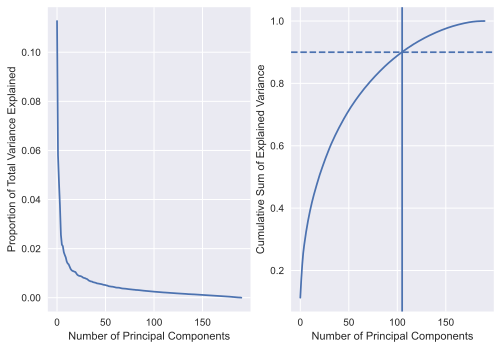

In [7]:
plot = capstone_utils.pca_explore(sl_en)
plt.savefig('images/pca.png')
plot.show()

From the output we can see that the majority of variance is explained by the first 10 principal components. However, the standard threshold of 90% explained variance is not reached unless at least 100 components are included. We will reduce our dimensions to 500 to ensure that the differences in the song data can be used to provide useful and specific recommendations to the system user. 

The `pca_dim` function returns a dataframe of data reduced to the chosen 105 dimensions. Again, we will use a Min-Max Scaler to ensure that there is no bias in units. 

In [8]:
sl_pca = capstone_utils.pca_dim(sl_en, scaler='minmax', n_components_=105)

Now that we have reduced the dimensions of our dataset we can begin considering whether finding clusters of specific songs will be useful features in our recommendation systems. 

## Clustering <a id=Clustering a>

As we have a large variation of songs in our dataset, it may be helpful to look for clusters that could represent specific types of songs. In order to find a clustering that fits the dataset well we will consider three algorithms: KMeans, a Density-Based Scan and an Agglomerative Hierarchical Clustering. Before implementing them we will first go through the algorithms, how they find clusters and the parameters we need to consider. 

#### KMeans
Firstly, KMeans is based in distance as a measure of the strength of a cluster. To initialise, it randomly guesses the centroids of the chosen number of clusters (this algorithm requires that a number of clusters be chosen). Once these middle point are established each point in the dataset is assigned to the nearest centroid, and these form clusters. The new centroids are then calculated from the average of the points in the clusters. When these new centers are established, every point is reassigned to the nearest center. This iterative process continues until the changes in centroid placement are negligible. There is a slight risk in KMeans, in that there runs a risk of multiple clusters converging to the same local minimia. 

Evaluating KMeans means looking at how much variance in explained by adding another cluster. When fitting KMeans we are trying to minimise the distances between each point and the center, for the whole cluster, for all clusters. This can be measured as the within sum of squared (in other words the total for the sum of squares in each cluster) or inertia. When choosing a number of clusters we want to minimise this value, but only to the point that adding another one would not make a large difference. This would be overcomplicating the clustering. Therefore we will consider the elbow plot of the Inertia against number of clusters to consider an optimal. We will also be using Silhouette Score to consider the effectiveness of the clusters. Silhouette score is a measure of how similar points are to their assigned clusters, relative to how similar they are to other clusters. Therefore, we are aiming to maximise this value. 

For our purposes we will look at clusters of size 2 to 15. Beyond 15 would be too many clusters to gain much value from.

#### DBScan

After consider the distance-based KMeans, we will see how will a density-based algorithm works. DBScan has two parameters that need to be tuned: epsilon and minimum samples. The algorithm looks within a certain distance (epsilon in all directions) and counts how many data points are in this area (the density of the area). A point is known as a core point if, within this areas, there are at least the minimum number of samples. If not, the point is regarded as a non-core point. To define clusters, the algorithm groups together core points that cross into each others' epsilon-defined areas. Groups of these that are large enough will create clusters. Non-core points may be within the area of a core point, and in this case will be defined within the neighboring core points' cluster. As there are non-core points that may have no core point neighbors, DBScan allows for noise (meaning it is less sensitive to outliers than KMeans, where all points need to be assigned to clusters). In order to evaluate the best DBScan model,  we will alos use the silhouette score. 

In this case we will look at epsilons of sizes: [1, 1.2, 1.4, 1.5, 1.6, 1.7, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8]. This will give us a good range of distances. If we make epsilon too small, there may be too little overlap between areas to cluster and if we make it too big, the algorithm may oversimplify and group together clusters. We will look at minimum sample values from 4 to 10, any less than this we may end up with noise data in a cluster and any more we would have lots of small clusters in areas where one may suffice. Because we can find noise points, we will calculate the number of noise points for each iteration of DBScan to see how many outliers there are. 

#### Hierarchical (Agglomerative) Clustering


Hierarchical Clustering is based in making connections of nearest points. Initially, every point is considered a cluster. Distances between each pairwise combination of clusters are calculated to find which clusters are closest together, and these are then merged. This is could continue on until all data points are within one cluster, but the algorithm stops when some criteria is met.

There are a few ways to consider the distances, or linkages, between clusters. Single linkage considers the closest points that connect the clusters (this is more prone to extreme values). Complete (or maximum) linkage measure the points furthest away from each other (again, prone to extremes). Average linkage considers the mean distance between points. Finally, ward's linkage joins clusters so that the variance increase is minimized when combining. We will consider all of these linkages in our search. sklearn's Agglomerative Clustering limits itself by the number of clusters it finds - the algorithm stops when reduced to this many. This means that, like KMeans, we need to pick suitable number of clusters. We will use the same amount as for KMeans - 2 to 15. 

Now that we have considered our algorithms we can begin to fit these. In order to compare the outputs we have created a function named `clustering_adventure` in the `capstone_utils` package. This function creates a dataframe to keep track of the different algorithms, and calls functions to iterate over all of the parameters. It then returns plots to demonstrate the differing effectiveness of the models with different parameters. From there we will make decisions about how we can best cluster our data. 

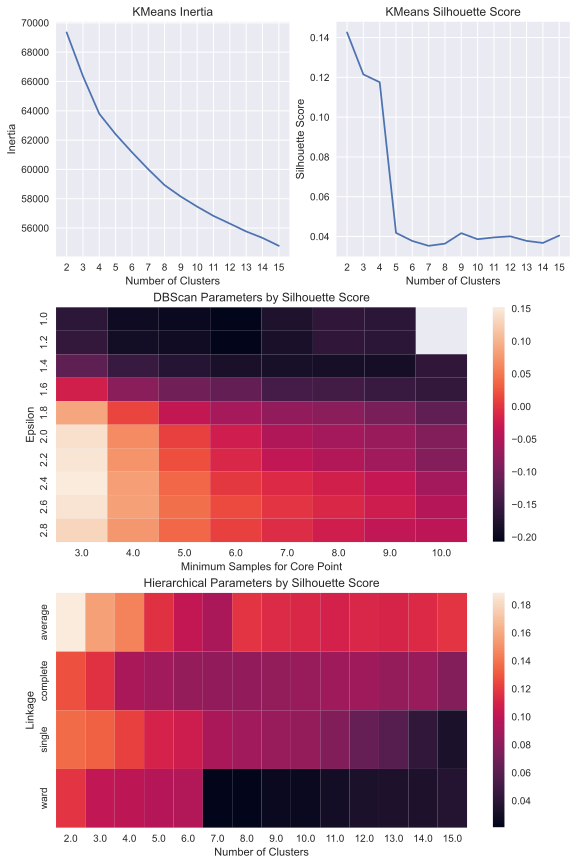

In [9]:
cluster, plt = capstone_utils.clustering_adventure(sl_pca, k_vals=list(range(2, 16)),
                                                   epsi = [1, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8],
                                                   min_samples_= list(range(3, 11)),
                                                   max_num_clusters_agglo = list(range(2, 16)))
plt.tight_layout()
plt.savefig('images/clusters.png')
plt.show()

These plots give us an indication of the best parameters for each of our models. For KMeans, it seems that using any less than 2 clusters would be unreasonable but the smoothness of the elbow plot of Inertia shows that there is no clear number of clusters that works better than others - at no point does addition another cluster have a negligible impact on variances explained.

For our Hierarchical Clustering it seems clear that using an `average` linkage with 2 clusters is the best option. But there is still a very small silhouette score, visualising this clustering could give us a better idea of the form. 

Finally, we could assume that using an epsilon value of 2.4, with a min_samples of 3, could give us good clustering. However, we will first check the number of clusters created by this, as well as the amount of noise points. To have an understanding of how these values change we will look at all the clusters with a min_sample of 3.  

In [10]:
cluster[(~cluster['epsilon'].isna()) &(cluster['min_samples_db'] == 3.0)].sort_values(
    by='silhouette_score', ascending=False)[['model', 'silhouette_score', 
                                            'num_clusters', 'epsilon', 'min_samples_db', 'number_noise_points']]

,model,silhouette_score,num_clusters,epsilon,min_samples_db,number_noise_points
21,"DBSCAN(eps=2.4, min_samples=3)",0.151795,379.0,2.4,3.0,1699.0
20,"DBSCAN(eps=2.2, min_samples=3)",0.145136,374.0,2.2,3.0,1876.0
22,"DBSCAN(eps=2.6, min_samples=3)",0.143658,348.0,2.6,3.0,1577.0
19,"DBSCAN(eps=2.0, min_samples=3)",0.141666,377.0,2.0,3.0,1962.0
23,"DBSCAN(eps=2.8, min_samples=3)",0.131705,321.0,2.8,3.0,1461.0
18,"DBSCAN(eps=1.8, min_samples=3)",0.088122,336.0,1.8,3.0,2239.0
17,"DBSCAN(eps=1.6, min_samples=3)",-0.021775,263.0,1.6,3.0,2751.0
16,"DBSCAN(eps=1.4, min_samples=3)",-0.120052,195.0,1.4,3.0,3207.0
15,"DBSCAN(eps=1.2, min_samples=3)",-0.159770,156.0,1.2,3.0,3440.0
14,"DBSCAN(eps=1, min_samples=3)",-0.165205,150.0,1.0,3.0,3473.0


This output is not encouraging for our clustering, as there are far too many clusters in all these cases as well as a seriously high number of noise points. On though of this we still have silhouette scores that can not justify any of these issues.

## tSNE For Visualisaiton

Though Hierarchical Clustering, with two clusters, seems like the best option in our search, we will visualise this and our optimal kmeans clustering (k_val equalling to 2) to understand how they are formed. t-distributed Stoachastic Neighbouring (tSNE) will allow us to this. tSNE builds on the assumption that if there are clusters in higher dimensions, these should be visualisable in lower dimensions. It projects distance between one point and all other points onto a t-distribution and then gives higher weights to points that are closers and 'pushes away' far points. It then iterates over lower dimensions to find a combination that represents the data points well. To visualise our chosen clusterings we will reduce the dimensions using tSNE and then color each point dependening on the cluster it is assigned to. We will plot the tSNE reduction (with 3 dimensions) pairwise, to see how the clusters perform when visualised pairwise.

As a note, we know that KMeans will show 2 clusters and Hierarchical will show 2, but DBScan will show far more, with about 5000. We will not use DBScan, because even the optimal has far too many clusters and noise. Therefore we will only consider KMeans and Hierarchical. Before plotting the tSNE data with clustering labels, we need to add the labels to the dataset. This is done using the `cluster_labels` function, the visualisations are then created in the `tsne_vis` function.

In [11]:
sl_cluster_labelled = capstone_utils.cluster_labels(sl_pca, cluster, dbscan=False, 
                                     opt_k=2, opt_linkage='average', opt_num_agglo_clusters=2.0)

In [12]:
tsne_plots = capstone_utils.tsne_vis(sl_cluster_labelled)

/Users/pippidebree/opt/anaconda3/envs/capenv/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/pippidebree/opt/anaconda3/envs/capenv/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


<Figure size 800x550 with 0 Axes>

<Figure size 800x550 with 0 Axes>

Though we were more confident in our Agglomerative Clustering in our results, the visualisation has exposed that these clusters are very unbalanced in size. If we then consider the 2 cluster KMeans choice, it does not seems distinct enough or have a high enough silhouette score to justify using. Unfortunately, out exploration of clustering did not result in a cluster that could serve as a user feature in our dataset. Regardless, we will export our pca-reduced song data. (As we have made no changes to our taste profile we do not need to export a different version). 

In [13]:
# Because we have not added a clustering label column, we can export our pca reduced data.
sl_pca.to_csv('data/sub_lmd_pca.csv')

# Conclusion <a id=Conclusion a> 

Though we did not manage to create a feature for our song data using clustering, an appropriate rating system for our recommendation systems was found. With the `scaling_mmb` function ready, we can begin to look on to comparing building our systems.